<B>Introduction

Huffpost, a US based company which reports news through online medium, on their website. One of main functionality of Huffpost is, they take inputs from readers and covers only those topics readers are interested in. Therefore, those news needs to be categorized as per its type. 
It would be best for the company if they could build an algorithm which could categorize news article on the basis of only news headline and short descriptions about the headline. To build an optimized algorithm for this problem, Huffpost only have to input very basic details about the news such as, news heading, short description of the news, etc. It will be categorized automatically without any involvement of human to read news and categorizing it manually. This will boost the process of reporting fresh news on portals. 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<B>Problem Statement

The problem is based on Text Classification of the News articles. The goal is to categorize new articles into multiple classes as per its type, given heading and short description about news articles. .

In [2]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!nvidia-smi

Tue Feb 23 08:38:38 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Load Python Packages

In [4]:
import numpy as np
import pandas as pd
import re
import spacy
from spacy.lang.en.stop_words import STOP_WORDS as stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier as svm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
import unicodedata
from wordcloud import WordCloud
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [5]:
dataset = pd.read_json('/content/drive/MyDrive/Colab Notebooks/News_Category_Dataset_v2.json', lines=True)
dataset.head()

,category,headline,authors,link,short_description,date
0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,Melissa Jeltsen,https://www.huffingtonpost.com/entry/texas-ama...,She left her husband. He killed their children...,2018-05-26
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Andy McDonald,https://www.huffingtonpost.com/entry/will-smit...,Of course it has a song.,2018-05-26
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,Ron Dicker,https://www.huffingtonpost.com/entry/hugh-gran...,The actor and his longtime girlfriend Anna Ebe...,2018-05-26
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,Ron Dicker,https://www.huffingtonpost.com/entry/jim-carre...,The actor gives Dems an ass-kicking for not fi...,2018-05-26
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,Ron Dicker,https://www.huffingtonpost.com/entry/julianna-...,"The ""Dietland"" actress said using the bags is ...",2018-05-26


Here we have 6 columns in our dataset. Column Category is target variable, where we have to predict category of news on the basis of available features.

Coming to available features, From available feature I dont think variable 'link' and 'date' will be of any use to predict categoery here. Therefore, first we will drop these features.

In [6]:
dataset.drop(['link', 'date'], axis = 1, inplace = True) 

In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200853 entries, 0 to 200852
Data columns (total 4 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   category           200853 non-null  object
 1   headline           200853 non-null  object
 2   authors            200853 non-null  object
 3   short_description  200853 non-null  object
dtypes: object(4)
memory usage: 6.1+ MB


Now size of our dataset is 200853rows x 4columns and all the variables are  of object type. Here as per above ouput, There are no Null values present in the data. But there is possibility of empaty values or spaces as these are object data. We should explore more on this.

In [8]:
dataset.describe().T

,count,unique,top,freq
category,200853,41,POLITICS,32739
headline,200853,199344,Sunday Roundup,90
authors,200853,27993,,36620
short_description,200853,178353,,19712


From above output it seems there are empty values or blank spaces in variable 'authors' and 'short_description' columns

Now we should check 'authors' column first, if it could be useful to predict our target variable. 

In [9]:
dataset['authors'].value_counts()

                                                             36620
Lee Moran                                                     2423
Ron Dicker                                                    1913
Reuters, Reuters                                              1562
Ed Mazza                                                      1322
                                                             ...  
LOLITA C. BALDOR, AP                                             1
Luciana Lopez and Chris Kahn, Reuters                            1
Stephanie Rawlings-Blake, Contributor\nMayor of Baltimore        1
Philip Lewis and Ruby Mellen                                     1
Robert L. Gordon III and Monique Rizer, Contributors             1
Name: authors, Length: 27993, dtype: int64

In [10]:
print('Number of fields ',len(dataset[dataset['authors'] == ""]))

Number of fields  36620


Best thing to do would be to drop te author columns - since it wont give us that much information

 <font color="grey">Proposal for future work: Try and fill it in with known authors for the specific category,We could also plot some features and their corellation to really see how each column is connected to each of the other columns and try to use that information to optimize the models even more </font>

In [11]:
dataset.drop(['authors'], axis = 1, inplace = True,errors='ignore') 
dataset.columns.values

array(['category', 'headline', 'short_description'], dtype=object)

Now before moving to pre-processing of rest of the columns, We will check the distribution of the target variables. 

In [12]:
print("We have a total of {} categories".format(dataset['category'].nunique()))
dataset['category'].value_counts()

We have a total of 41 categories


POLITICS          32739
WELLNESS          17827
ENTERTAINMENT     16058
TRAVEL             9887
STYLE & BEAUTY     9649
PARENTING          8677
HEALTHY LIVING     6694
QUEER VOICES       6314
FOOD & DRINK       6226
BUSINESS           5937
COMEDY             5175
SPORTS             4884
BLACK VOICES       4528
HOME & LIVING      4195
PARENTS            3955
THE WORLDPOST      3664
WEDDINGS           3651
WOMEN              3490
IMPACT             3459
DIVORCE            3426
CRIME              3405
MEDIA              2815
WEIRD NEWS         2670
GREEN              2622
WORLDPOST          2579
RELIGION           2556
STYLE              2254
SCIENCE            2178
WORLD NEWS         2177
TASTE              2096
TECH               2082
MONEY              1707
ARTS               1509
FIFTY              1401
GOOD NEWS          1398
ARTS & CULTURE     1339
ENVIRONMENT        1323
COLLEGE            1144
LATINO VOICES      1129
CULTURE & ARTS     1030
EDUCATION          1004
Name: category, 

There are 41 different categories with big differences in the number of articles they each have (the top one has 32739 rows, and the last one has 1004, which is 32 times less data).Let us visualize the same and check what are the percentage of categories in the dataset

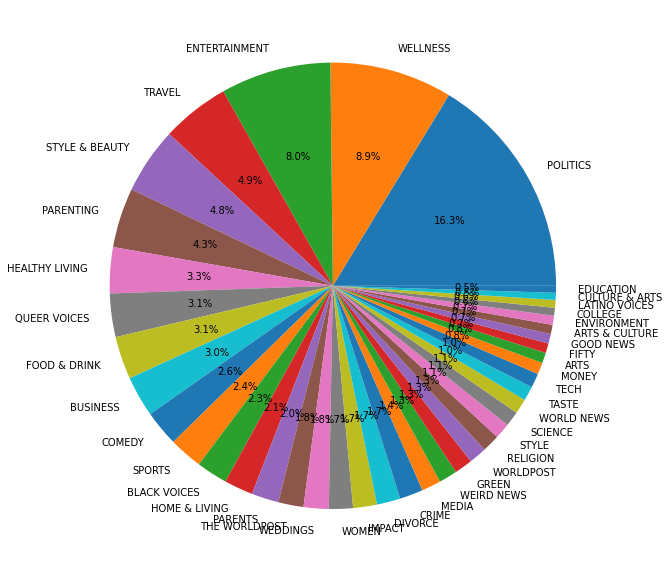

In [13]:
fig = plt.figure(figsize=(10,20))
plt.pie(dataset['category'].value_counts().values, 
        labels=dataset['category'].value_counts().index,
        autopct='%1.1f%%');

Since we do require more data for this task, we will focus on the categories that have enough articles that the model can learn from. This means that we will work with top 3 categories from this dataset, that have the most news articles in them. This will help us to improve our accuracy and to have a more balanced final version of our dataset.

In [14]:
pd.DataFrame(dataset['category'].value_counts()[:3])


,category
POLITICS,32739
WELLNESS,17827
ENTERTAINMENT,16058


In [15]:
top_categories = dataset['category'].value_counts().index[:3]
dataset=dataset[dataset['category'].isin(top_categories)]
dataset.head()

,category,headline,short_description
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Of course it has a song.
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,The actor and his longtime girlfriend Anna Ebe...
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,The actor gives Dems an ass-kicking for not fi...
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,"The ""Dietland"" actress said using the bags is ..."
5,ENTERTAINMENT,Morgan Freeman 'Devastated' That Sexual Harass...,"""It is not right to equate horrific incidents ..."


Let us visualize dataset distribution on the basis of category again 

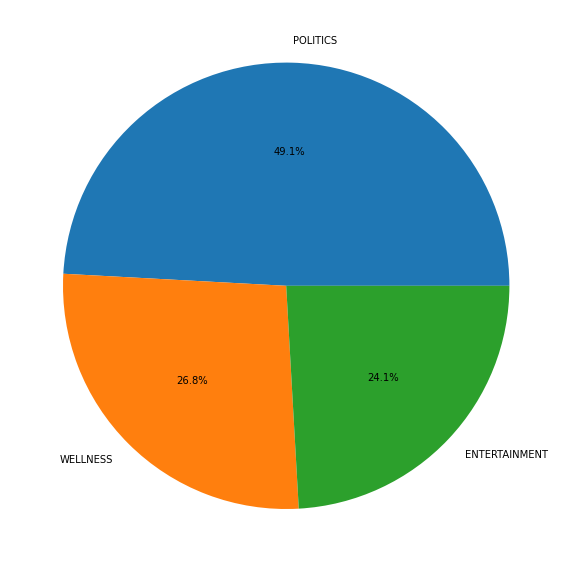

In [16]:
fig = plt.figure(figsize=(10,20))
plt.pie(dataset['category'].value_counts().values, 
        labels=dataset['category'].value_counts().index,
        autopct='%1.1f%%');

In [17]:
print('Updated shape of dataset is',dataset.shape)

Updated shape of dataset is (66624, 3)


Next, we can look for the number of unique headlines

In [18]:
dataset['headline'].nunique()

66430

We can find the difference between the total number of headlines and unique headlines, so we can find the number of repeated headlines

In [19]:
len(dataset['headline'])- dataset['headline'].nunique()

194

Now first we should check the counts of target variables

In [20]:
dataset[dataset['short_description'] == ""]['category'].value_counts()

POLITICS         3161
ENTERTAINMENT    2588
WELLNESS            2
Name: category, dtype: int64

In [21]:
dataset['headline'].value_counts() 

Sunday Roundup                                                                            90
The Moment I Knew                                                                         16
What To Watch On Hulu That’s New This Week                                                 5
What To Watch On Amazon Prime That’s New This Week                                         5
Here Are The Movies Coming To Netflix This Week                                            4
                                                                                          ..
Trump Says He 'Really Didn't Care' About Drilling Arctic Refuge. Then A Friend Called.     1
Friday's Morning Email: Inside North Korea's Nuclear Test                                  1
Volunteering Is Good For The Heart And 7 Other Heart-Healthy Habits                        1
Narrowly-Divided FDA Panel Votes To Modify Avandia Restrictions                            1
Inside The NAACP’s Fight To Stop Betsy DeVos From Expanding Charter Sc

We should cross check if even short descriptions of same headlines are same

In [22]:
dataset[dataset['headline']=='Sunday Roundup']['short_description'].nunique()

90

In [23]:
len(dataset[dataset['headline']=='Sunday Roundup']['short_description']) - dataset[dataset['headline']=='Sunday Roundup']['short_description'].nunique()

0

Now we can focus on the 'short_description' column, since the text in this column is usually longer than the headline. We will try to find if there are some descriptions that are repeated

In [24]:
dataset['short_description'].value_counts()

                                                                                                                                                                                          5751
Welcome to the HuffPost Rise Morning Newsbrief, a short wrap-up of the news to help you start your day.                                                                                    192
The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS                                                                 125
The stress and strains of our always-connected lives can sometimes take us off course. GPS For The Soul can help you find                                                                   23
Need a time out? You're in luck. In honor of Bliss' Triple Oxygen Month, HuffPost's GPS for the Soul has teamed up with Bliss                                                               21
                                             

Next, lets check out for this description that is repeated: "Welcome to the HuffPost Rise Morning Newsbrief, a short wrap-up of the news to help you start your day."

If the headline is the same for every sample, we can just leave one value in our dataframe for this

In [25]:
dataset[dataset['short_description'] == 'Welcome to the HuffPost Rise Morning Newsbrief, a short wrap-up of the news to help you start your day.']['headline'].nunique()

192

In [26]:
dataset[dataset['short_description'] == 'Welcome to the HuffPost Rise Morning Newsbrief, a short wrap-up of the news to help you start your day.']

,category,headline,short_description
51112,POLITICS,HuffPost Rise: What You Need To Know On August 9,Welcome to the HuffPost Rise Morning Newsbrief...
51228,POLITICS,HuffPost Rise: What You Need To Know On August 8,Welcome to the HuffPost Rise Morning Newsbrief...
51435,POLITICS,HuffPost Rise: What You Need To Know On August 5,Welcome to the HuffPost Rise Morning Newsbrief...
51569,POLITICS,HuffPost Rise: What You Need To Know On August 4,Welcome to the HuffPost Rise Morning Newsbrief...
51662,POLITICS,HuffPost Rise: What You Need To Know On August 3,Welcome to the HuffPost Rise Morning Newsbrief...
...,...,...,...
78329,POLITICS,"HuffPost Rise Morning Newsbrief, October 5",Welcome to the HuffPost Rise Morning Newsbrief...
78611,POLITICS,"HuffPost Rise Morning Newsbrief, October 2",Welcome to the HuffPost Rise Morning Newsbrief...
78666,POLITICS,"HuffPost Rise Morning Newsbrief, October 1",Welcome to the HuffPost Rise Morning Newsbrief...
78758,POLITICS,"HuffPost Rise Morning Newsbrief, September 30",Welcome to the HuffPost Rise Morning Newsbrief...


We can see that the headlines are basically the same, just that the date is changining. This means that we can try to remove the dates and see the number of unique values after this

In [27]:
from dateutil import parser

def is_valid_date(date_str):
    try:
        (date_str.isdigit() or parser.parse(date_str))
        return True
    except:
        return False
dataset['short_description'] = [' '.join([w for w in line.split() if not is_valid_date(w)]) for line in dataset['short_description']]
dataset['headline'] = [' '.join([w for w in line.split() if not is_valid_date(w)]) for line in dataset['headline']]

In [28]:
dataset['short_description'].value_counts()

                                                                                                                                                                                                                                                                                  5751
Welcome to the HuffPost Rise Morning Newsbrief, a short wrap-up of the news to help you start your day.                                                                                                                                                                            192
The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS                                                                                                                                                         125
The stress and strains of our always-connected lives can sometimes take us off course. GPS For The Soul can help you find                                          

Let us take look at Headline Columns

In [29]:
dataset['headline'].value_counts()

HuffPost Rise: What You Need To Know On                                            164
Roundup                                                                             90
News Roundup for                                                                    61
HuffPost Rise Morning Newsbrief,                                                    30
HuffPost Headline Quiz: to                                                          20
                                                                                  ... 
Donald Trump Accidentally Showed Some Respect For Women With His Abortion Gaffe      1
Uncontrolled High Blood Pressure Raise Alzheimer's Risk                              1
Trump Vows To 'Destroy' The Law That Bans Churches From Endorsing Candidates         1
Disturbed By Current Politics? Here's How To Get Involved                            1
Inside The NAACP’s Fight To Stop Betsy DeVos From Expanding Charter Schools          1
Name: headline, Length: 65987, dtype: int64

Lets also take a look at the unique headlines for this short description

In [30]:
dataset[dataset['short_description'] == 'Welcome to the HuffPost Rise Morning Newsbrief, a short wrap-up of the news to help you start your day.']['headline'].value_counts()

HuffPost Rise: What You Need To Know On    161
HuffPost Rise Morning Newsbrief,            30
What You Need To Know On                     1
Name: headline, dtype: int64

We can now keep just one instance of each of these headlines.First, let's check out some more samples with same descriptions

In [31]:
dataset[dataset['short_description'] == 'The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS']

,category,headline,short_description
125041,WELLNESS,Reminders That Lessons Don't Always Exist With...,The stress and strain of constantly being conn...
125286,WELLNESS,Spontaneous Doodles To Inspire Your Next Creat...,The stress and strain of constantly being conn...
126345,WELLNESS,Reminders That The Best Is Yet To Come,The stress and strain of constantly being conn...
126408,WELLNESS,This Graffiti Art Proves You Can Find Encourag...,The stress and strain of constantly being conn...
126475,WELLNESS,This Will Inspire You To Transform Your Gloomy...,The stress and strain of constantly being conn...
...,...,...,...
169836,WELLNESS,GPS Guide: Dr. Frank Niles Finds His Center,The stress and strain of constantly being conn...
170172,WELLNESS,GPS Guide: Amanda Slavin Shares How She Lives ...,The stress and strain of constantly being conn...
170939,WELLNESS,"GPS Guide: Layla Crawford, Actor, Shares How S...",The stress and strain of constantly being conn...
171043,WELLNESS,GPS Guide: Jonathan Talat Phillips' Soulful In...,The stress and strain of constantly being conn...


We have 125 rows with this description. Now lets see about the uniqueness of the headlines

In [32]:
dataset[dataset['short_description'] == 'The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS']['headline'].value_counts()

These Sweet Coffee Cup Messages Will Bring A Smile To Your Day                     1
Colors That Can Change Your Mood And Outlook                                       1
This Graffiti Art Proves You Can Find Encouragement Anywhere (PHOTOS)              1
These Sounds Will Promote Your Productivity And Creativity                         1
Breathtaking Trails To Savor Fall's Seasonal Beauty                                1
                                                                                  ..
Fireplaces To Help Unwind Your Mind                                                1
Slow Down With These Stunning Cloud Photos                                         1
Stress-Busting Mantras That Keep You Relaxed                                       1
These Serene Spas Will Help You Recharge (PHOTOS)                                  1
GPS Guide: Rainforest Scenes That'll Make You Feel Instantly Refreshed (PHOTOS)    1
Name: headline, Length: 125, dtype: int64

These headlines are all unique

Now first we should check blank values/empty spaces for columns 'Healdine' and 'Short Description'. We will drop such rows, as without these fields our value will of no use 

In [33]:
print('Count of Blank Values/Empty Space in Headline column before dropping',len(dataset[dataset['headline']=='']))
print('Their counts on the basis of category\n ',dataset[dataset['headline'] == ""]['category'].value_counts())
dataset.loc[dataset['headline'] == "", 'headline'] = np.nan
dataset.dropna(subset=['headline'],inplace=True)
print('Count of Blank Values/Empty Space in Headline column after dropping',len(dataset[dataset['headline']=='']))

Count of Blank Values/Empty Space in Headline column before dropping 3
Their counts on the basis of category
  POLITICS    2
WELLNESS    1
Name: category, dtype: int64
Count of Blank Values/Empty Space in Headline column after dropping 0


In [34]:
print('Count of rows with Blank Values/Empty Space in short_description column before dropping',len(dataset[dataset['short_description']=='']))
print('Their counts on the basis of category \n',dataset[dataset['short_description'] == ""]['category'].value_counts())
dataset.loc[dataset['short_description'] == "", 'short_description'] = np.nan
dataset.dropna(subset=['short_description'],inplace=True)
print('Count of Blank Values/Empty Space in short_description column after dropping',len(dataset[dataset['short_description']=='']))

Count of rows with Blank Values/Empty Space in short_description column before dropping 5750
Their counts on the basis of category 
 POLITICS         3160
ENTERTAINMENT    2588
WELLNESS            2
Name: category, dtype: int64
Count of Blank Values/Empty Space in short_description column after dropping 0


In [35]:
dataset['short_description'].value_counts()

Welcome to the HuffPost Rise Morning Newsbrief, a short wrap-up of the news to help you start your day.                                                                                                                                                                           192
The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS                                                                                                                                                        125
The stress and strains of our always-connected lives can sometimes take us off course. GPS For The Soul can help you find                                                                                                                                                          23
Need a time out? You're in luck. In honor of Bliss' Triple Oxygen Month, HuffPost's GPS for the Soul has teamed up with Bliss                                         

Let us remove Duplicate Values

In [36]:
print('Shape of Dataset before removing the Duplicates',len(dataset))

Shape of Dataset before removing the Duplicates 60871


In [37]:
dataset.drop_duplicates(subset=['short_description','headline'], keep='first', inplace=True, ignore_index=True)

In [38]:
print('Updated Shape of Dataset is',len(dataset))

Updated Shape of Dataset is 60621


We removed around 250 duplicate values

In [39]:
dataset['short_description'].value_counts()

The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS                                                                                                     125
The stress and strains of our always-connected lives can sometimes take us off course. GPS For The Soul can help you find                                                                                                       22
GPS Guides are our way of showing you what has relieved others' stress in the hopes that you will be able to identify solutions                                                                                                 21
And more of the latest polling news.                                                                                                                                                                                            19
Ouch.                                                                                       

In [40]:
dataset['short_description'].nunique()

60018

Number of unique short descriptions - 60018

We see there are duplicates for short description column, I think there might be different headlines for all this same description, as they were not removed in above steps.  

In [41]:
dataset[dataset['short_description'] == 'The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS']['headline'].value_counts()

These Sweet Coffee Cup Messages Will Bring A Smile To Your Day                     1
Colors That Can Change Your Mood And Outlook                                       1
This Graffiti Art Proves You Can Find Encouragement Anywhere (PHOTOS)              1
These Sounds Will Promote Your Productivity And Creativity                         1
Breathtaking Trails To Savor Fall's Seasonal Beauty                                1
                                                                                  ..
Fireplaces To Help Unwind Your Mind                                                1
Slow Down With These Stunning Cloud Photos                                         1
Stress-Busting Mantras That Keep You Relaxed                                       1
These Serene Spas Will Help You Recharge (PHOTOS)                                  1
GPS Guide: Rainforest Scenes That'll Make You Feel Instantly Refreshed (PHOTOS)    1
Name: headline, Length: 125, dtype: int64

yes, We see there are different healines for this specific short description values. Hence, we are sure duplicates are removed properly in above steps. We willnot remove this healines as, words used in headlines would be usefull in prediction.

Let us check the categore for this specific description

In [42]:
dataset[dataset['short_description'] == 'The stress and strain of constantly being connected can sometimes take your life -- and your well-being -- off course. GPS']['category'].value_counts()

WELLNESS    125
Name: category, dtype: int64

They have the same category, it's WELLNESS - 125 rows. Let us check one more.

In [43]:
dataset[dataset['short_description'] == 'The stress and strains of our always-connected lives can sometimes take us off course. GPS For The Soul can help you find']['category'].value_counts()

WELLNESS    22
Name: category, dtype: int64

Now we can move on to text preprocessing - we star off by converting all the text to lowercase (for all three columns - 'category', 'headline', 'short_description')

In [44]:
# DATA PREPROCESSING - TEXT PREPROCESSING
#1. convert to lower case

dataset['category'] = dataset['category'].apply(lambda x: str(x).lower())
dataset['headline'] = dataset['headline'].apply(lambda x: str(x).lower())
dataset['short_description'] = dataset['short_description'].apply(lambda x: str(x).lower())

In [45]:
dataset.sample(10)

,category,headline,short_description
29386,politics,what you need to know about super,thirteen states vote in presidential primaries...
17557,entertainment,stephen colbert visits 'billy on the street' t...,"enter literal plastic bubble, stage right."
49095,wellness,third metric: candice bergen on trailblazing,candice bergen discusses how her role as murph...
50502,wellness,confessions of a hopeless night owl,as a self-confessed nocturnal who can blame it...
53492,wellness,"marathons and heart health: running farther, f...",by annie hauser more from everyday health: tra...
51087,wellness,steps to controlling your anger,keep a record of the situations that lead to y...
50905,wellness,energy drinks be riskier for some hearts more ...,"""energy drinks: riskier for some hearts more t..."
59315,wellness,bringing your dog to work could help to lower ...,"for more health benefits of pets, click throug..."
33552,entertainment,viola davis' daughter dressed up as her for ha...,viola > elsa.
54102,wellness,the best mobile apps for running,by kissairis munoz gone are the days of just l...


Next, we can do a contraction to expansion for abbreviated words.

In [46]:
contractions = { 
"ain't": "am not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how does",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so is",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
" u ": " you ",
" ur ": " your ",
" n ": " and ",
"won't": "would not",
"you're": "you are",
"you'll": "you will",
"you've": "you have",
"you'd": "you would",
"you'd've": "you would have",
"you'll've": "you will have",
"here's" : "here is",
"there's" : "there is",
"where's": "where is"
}

In [47]:
def cont_to_exp(x):
    if type(x) is str:
        for key in contractions:
            value = contractions[key]
            x = x.replace(key, value)
        return x
    else:
        return x

Apply this function to the headline and short description columns

In [48]:
dataset['headline'] = dataset['headline'].apply(lambda x: cont_to_exp(x))
dataset['short_description'] = dataset['short_description'].apply(lambda x: cont_to_exp(x))

In [49]:
dataset.sample(10)

,category,headline,short_description
20413,politics,colorado congressman hangs on after splitting ...,republican mike coffman won in a district that...
8802,entertainment,lin-manuel miranda sings 'magic school bus' th...,kate mckinnon's ms. frizzle is just a bit diff...
38225,politics,"this week in world war i,",the naval attack in had alerted ottoman forces...
50839,wellness,"tecfidera, oral multiple sclerosis drug, appro...","""that is an excellent label,"" said yee. ""i exp..."
30326,politics,watch highlights from the last gop debate befo...,marco rubio had a rough night.
32326,politics,what you need to know on,welcome to the huffpost rise morning newsbrief...
8477,entertainment,beyoncé and jay-z enjoy a kid-free evening at ...,"bey even caught a performance of ""dear evan ha..."
1683,entertainment,a saucy meme made 41-year-old fleetwood mac so...,listen carefully to the sound of... this meme.
46218,wellness,breast cancer vaccine being developed at cleve...,the cleveland clinic announced last month that...
50601,wellness,the healing powers of burgers and fried chicken,"the cause of obesity is complex, to be sure --..."


Next step is to find urls of pages and remove them from the text - for this we need to import library for regular expressions

In [50]:
# Tip:Split it into sub parts
#How can you check test cases for this
dataset['headline'] = dataset['headline'].apply(lambda x: re.sub(r'(http|https|ftp|ssh)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', '' , x))
dataset['short_description'] = dataset['short_description'].apply(lambda x: re.sub(r'(http|https|ftp|ssh)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', '' , x))

Removing special chars and punctuation - in case of a typo

In [51]:
dataset['headline'] = dataset['headline'].apply(lambda x: re.sub(r'[^\w ]+', "", x))
dataset['short_description'] = dataset['short_description'].apply(lambda x: re.sub(r'[^\w ]+', "", x))

Removing multiple spaces - in case of a typo

In [52]:
dataset['headline'] = dataset['headline'].apply(lambda x: ' '.join(x.split()))
dataset['short_description'] = dataset['short_description'].apply(lambda x: ' '.join(x.split()))

Make a function to remove accented chars - in case of non-english names and surnames

In [53]:
def remove_accented_char(x):
    x = unicodedata.normalize('NFKD', x).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return x

Apply this function for the headline and short_description columns

In [54]:
dataset['headline'] = dataset['headline'].apply(lambda x: remove_accented_char(x))
dataset['short_description'] = dataset['short_description'].apply(lambda x: remove_accented_char(x))

One of the most importaint steps - removing the stopwords

Stop Words: A stop word is a commonly used word (such as “the”, “a”, “an”, “in") that a search engine has been programmed to ignore, both when indexing entries for searching and when retrieving them as the result of a search query. Stopwords are the most common words in any natural language. For the purpose of analyzing text data and building NLP models, these stopwords might not add much value to the meaning of the document.

We will use the stopwords from the spacy library

In [55]:
# removing stopwords

dataset['headline'] = dataset['headline'].apply(lambda x: ' '.join([t for t in x.split() if t not in stopwords]))
dataset['short_description'] = dataset['short_description'].apply(lambda x: ' '.join([t for t in x.split() if t not in stopwords]))

Lets see how our data looks like now

In [56]:
dataset.sample(5)

,category,headline,short_description
20814,entertainment,annette bening california mama lovely new cent...,groove talking heads films release
3709,politics,san francisco dismiss reduce thousands past ma...,san francisco taking lead undo damage countrys...
35667,entertainment,olivia benson new title,cookie lyon empire daenerys targaryen game thr...
22267,politics,cities feed virginias deadliest jail lock hund...,people died hampton roads regional jail past m...
24526,politics,tamir rices neighborhood short drive far remov...,donald trumps message safety leaves people 12y...


Next, a good thing would be to do lemmatization - Convert into root form of word, example running = run

We will use the nltk library for this

In [57]:
import nltk

w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

In [58]:
def lemmatize_tokenize_text(text):
  return[lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)]

In [59]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

We will create two new columns in the table, named 'headline_lemmatized_tokenized' and 'short_description_lemmatized_tokenized' where we will store the tokenized and lemmatized text from columns headline and short_description

In [60]:
dataset['headline_lemmatized_tokenized'] = dataset.headline.apply(lemmatize_tokenize_text)
dataset['short_description_lemmatized_tokenized'] = dataset.short_description.apply(lemmatize_tokenize_text)

In [61]:
dataset.sample(5)

,category,headline,short_description,headline_lemmatized_tokenized,short_description_lemmatized_tokenized
21642,politics,san francisco police institutionalized bias mi...,recordkeeping use force report found sfpd sign...,"[san, francisco, police, institutionalized, bi...","[recordkeeping, use, force, report, found, sfp..."
15598,politics,paul ryan calls obamacare repeal plan act mercy,,"[paul, ryan, call, obamacare, repeal, plan, ac...",[]
31552,entertainment,bachelor season premiere recap ben higgins fee...,join journey,"[bachelor, season, premiere, recap, ben, higgi...","[join, journey]"
24000,entertainment,cares joker barely suicide squad got music video,sweet sweet revenge,"[care, joker, barely, suicide, squad, got, mus...","[sweet, sweet, revenge]"
2927,entertainment,kanye west kim kardashian film family feud epi...,host steve harvey asked kardashian body youre ...,"[kanye, west, kim, kardashian, film, family, f...","[host, steve, harvey, asked, kardashian, body,..."


We will  visualize the most repeated words in the dataset

In [62]:
#Fucntion to displays a list of words, the importance of each beeing shown with font size or color.
def WC1(text):
  text1 = ' '.join(text)
  print(text1)
  wc = WordCloud(width=800, height=400).generate(text1)
  plt.imshow(wc)
  plt.axis('off')
  plt.show()
  return 

In [63]:
#Function to diplay most occuring top 10  word in that category 
def plot_graph(dicti,column):
  f, ax = plt.subplots(figsize=(10, 10))
  labels = pd.DataFrame(dicti[column]).stack(level=0).value_counts().index[0:10]
  values = pd.DataFrame(dicti[column]).stack(level=0).value_counts().values[0:10]
  splot=sns.barplot(x = labels,y = values,dodge=False,hue=pd.DataFrame(dicti[column]).stack(level=0).value_counts().index[0:10])
  for p in splot.patches:
    splot.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va ='center', xytext = (0, 10), textcoords = 'offset points')
  plt.show()
  return 

In [64]:
#Create a dictionary with list of all the words occured in that category for headline_lemmatized_tokenized column
dict_headline={}
for category in dataset['category'].value_counts().index:
  dict_headline[category]=[word for value in dataset[dataset['category']==category]['headline_lemmatized_tokenized'] for word in value]

In [65]:
#Create a dictionary with list of all the words occured in that category for short_description_lemmatized_tokenized column
dict_short_description={}
for category in dataset['category'].value_counts().index:
  dict_short_description[category]=[word for value in dataset[dataset['category']==category]['short_description_lemmatized_tokenized'] for word in value]

**Headline Column**

smith joins diplo nicky jam world cups official song hugh grant marries time age jim carrey blasts castrato adam schiff democrats new artwork julianna margulies uses donald trump poop bags pick dog morgan freeman devastated sexual harassment claims undermine legacy donald trump lovin new mcdonalds jingle tonight bit watch amazon prime thats new week mike myers reveals like fourth austin powers film watch hulu thats new week justin timberlake visits texas school shooting victims trumps crackdown immigrant parents puts kids strained system trumps son concerned fbi obtained wiretaps putin ally met trump jr edward snowden trump loves vladimir putin booyah obama photographer hilariously trolls trumps spy claim ireland votes repeal abortion amendment landslide referendum ryan zinke looks reel critics grand pivot conservation trumps scottish golf resort pays women significantly men report twitter putstarwarsinotherfilms universally entertaining jack johnson pardoned taboo sex criminalized bis

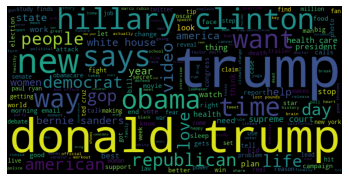

In [66]:
WC1(dataset['headline'])

So in Headline column we see most occuring words are hillary, clinton, american, trump, donald, love, etc. These words looks from 'Politics' Category. This makes sense becasue we have 50% of our data from politics category. Therefore, we will need to check occurance of words category wise. But before doing this, we will check same for Short Description column.  

**Short Description Column**

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



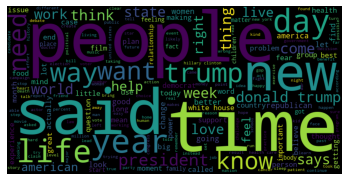

In [67]:
WC1(dataset['short_description'])

In Short Description, we see most occuring words are said, time, year, people, new, day, trump. Looks like we have got words from all the categories. But still it is important to check these occurance of words category wise. 

**headline_lemmatized_tokenized Column**

Word Cloud headline_lemmatized_tokenized for **'Entertainment'** Category 

smith join diplo nicky jam world cup official song hugh grant marries time age jim carrey blast castrato adam schiff democrat new artwork julianna margulies us donald trump poop bag pick dog morgan freeman devastated sexual harassment claim undermine legacy donald trump lovin new mcdonalds jingle tonight bit watch amazon prime thats new week mike myers reveals like fourth austin power film watch hulu thats new week justin timberlake visit texas school shooting victim twitter putstarwarsinotherfilms universally entertaining kanye west spent 85000 photo whitney houston bathroom album cover people rattled nigerian man look like chadwick boseman david cross prof he terrible apologizing sesame street creator sue maker upcoming adultthemed puppet film missed saddest death avenger infinity war george takei accuser walk story drugging sexual assault samantha bee parent think america basically war zone pete davidson say mental illness ruin romance james corden adam levine pulled carpool karaoke

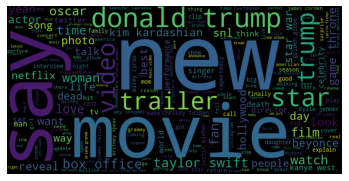

In [68]:
WC1(dataset[dataset['category']=='entertainment']['headline_lemmatized_tokenized'].apply(lambda x: ' '.join(t for t in x)))

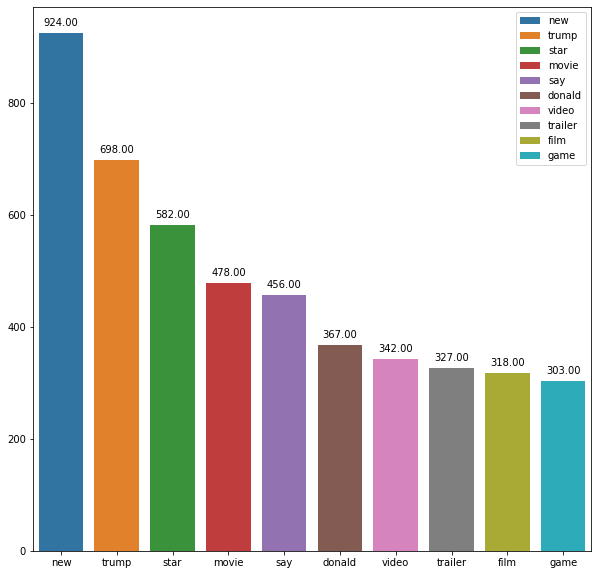

In [69]:
plot_graph(dict_headline,'entertainment')

For 'Entertainment' category, we have new, trump, star, movie, video in most occurance of word. This makes sense for this category and conlude thise values could help to classify the categories.

Word Cloud headline_lemmatized_tokenized for 'politics' Category

trump crackdown immigrant parent put kid strained system trump son concerned fbi obtained wiretap putin ally met trump jr edward snowden trump love vladimir putin booyah obama photographer hilariously troll trump spy claim ireland vote repeal abortion amendment landslide referendum ryan zinke look reel critic grand pivot conservation trump scottish golf resort pay woman significantly men report jack johnson pardoned taboo sex criminalized bishop michael curry join christian white house reclaim jesus chinese exclusion act help understand immigration politics today roger stone pressed damaging email hillary clinton wikileaks report publix suspends contribution nrabacked politician amid protest twitter bot delivered donald trump victory research paper say member farright proud boy menaced twitter user doorstep thing nra blamed texas school shooting happens catholic hospital try save trump new executive order easier fire federal worker michelle obama reveals cover upcoming memoir trump roa

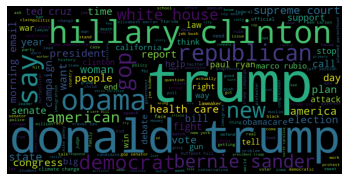

In [70]:
WC1(dataset[dataset['category']=='politics']['headline_lemmatized_tokenized'].apply(lambda x: ' '.join(t for t in x)))

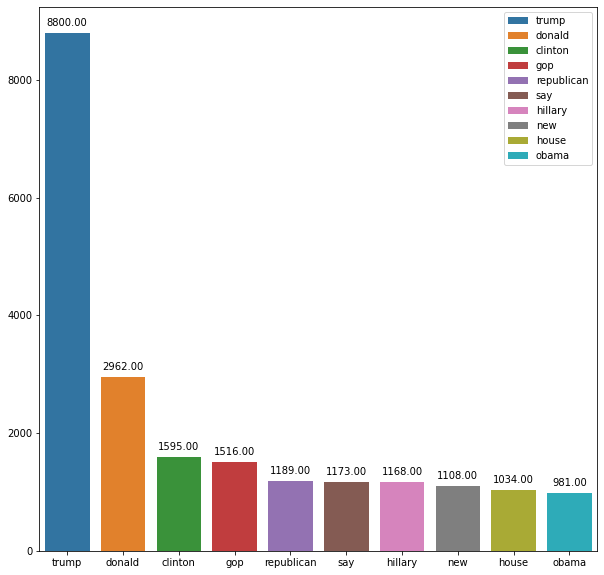

In [71]:
plot_graph(dict_headline,'politics')

For 'politics' category, we see word 'trump' has occured most of the times and there is huge difference between occrunce of 'donald' and 'clinton' which are 2nd and 3rd most occured word. This makes sense, as trump is a politian and president of US, he is more likely to be in headlines.

Word Cloud headline_lemmatized_tokenized for 'wellness' Category

overeating fat habit people healthy relationship food thing stealing joy moment life fat fact great sleep night big race woman filmed day pushup result inspire brain stone found man celiac disease want cancer word surprising thing exercise brain common uterine fibroid surgery spread undetected cancer fda warns benioff doctrine fda approves drug ragweed pollen allergy woke walk sleep cure neurological disease judgmental question balance ambitious career goal love life simple step end fight mind social medium mindfulness musician creative flow reminder lesson exist classroom wall tip stressfree marathon badge honor learning wear bald proudly springtime pairing enhance day felt mommy got sick traumatic brain injury linked emotional issue teen high altitude low obesity finding brown fat mri big step obesity research maryland governor sign bill license naturopathic doctor mindfulness everyday life desperately seeking happiness easier think childhood bullying effect year later study find nav

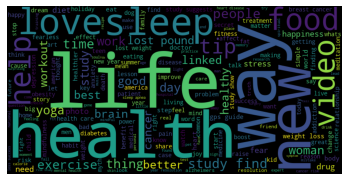

In [72]:
WC1(dataset[dataset['category']=='wellness']['headline_lemmatized_tokenized'].apply(lambda x: ' '.join(t for t in x)))

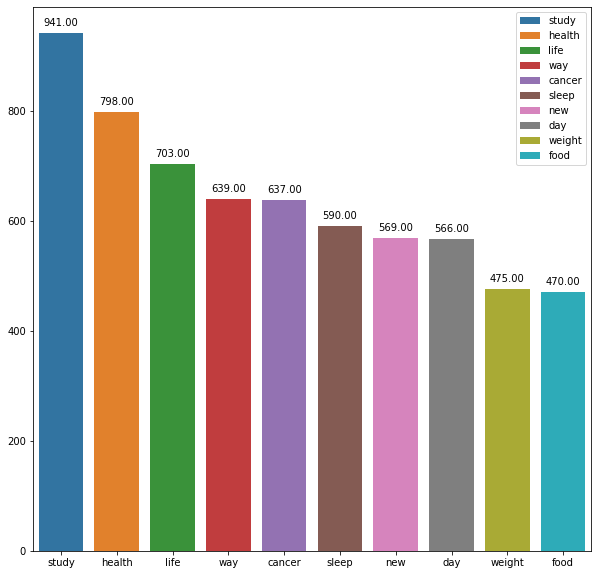

In [73]:
plot_graph(dict_headline,'wellness')

For 'Wellness'category, we see most occured words are study, health, life, way, etc. This makes sense and we could conclude these words would help to classify category.

**short_description_lemmatized_tokenized Column**

Word Cloud of short_description_lemmatized_tokenized for 'entertainment' Category

course song actor longtime girlfriend anna eberstein tied knot civil ceremony actor give dems asskicking fighting hard donald trump dietland actress said bag cathartic therapeutic moment right equate horrific incident sexual assault misplaced compliment humor said statement catchy right great miniseries joining week myers kid pushing new power film getting recent academy awardwinning movie pop star wore santa fe strong shirt houston thing star war pusha t album produced west feature photo late singer bathroom suleiman abdulfatai look like actor longlost brother comedian suggested jessica walter abusive set saying hed apologize defending jeffrey tambor happytime murder refers classic tagline director joe anthony russo answer pressing question star trek actor accused groping model year ago dad sent kevlar vest snl star reacted criticism date ariana grande borderline personality disorder bound happen curious farewell season crazy exgirlfriends vella lovell push oldschool male actor norm a

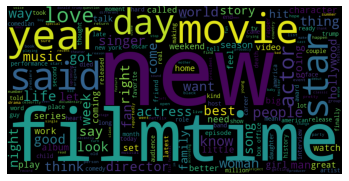

In [74]:
WC1(dataset[dataset['category']=='entertainment']['short_description_lemmatized_tokenized'].apply(lambda x: ' '.join(t for t in x)))

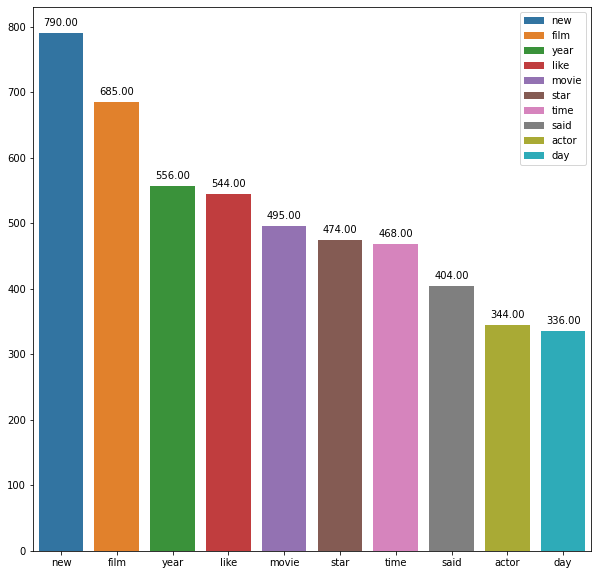

In [75]:
plot_graph(dict_short_description,'entertainment')

For Entertainment category, we have more expected words in short description than headline column.  

Word Cloud of short_description_lemmatized_tokenized for 'politics' Category

month health human service official revealed government unable locate nearly child released custody wiretap feature conversation alexander torshin alexander romanov convicted russian money launderer count robert mueller nail nsa whistleblower warns peeping minute irish woman longer travel united kingdom end pregnancy interior secretary attempt damage control hunting fishing group didnt like fossil fuel focus time male female executive new law fight sex trafficking target people ostensibly aim protect curry christian mean rejecting white nationalism misogyny protecting immigrant refugee poor chinese exclusion act barely get mentioned history class new pb documentary director ric burn lishin yu change stone contact julian assange reportedly told ask wikileaks favor day publix know going away guncontrol activist said result suggest given narrow margin victory vote bot effect likely marginal possibly large affect outcome videographer fun farright extremist group online showed house godless

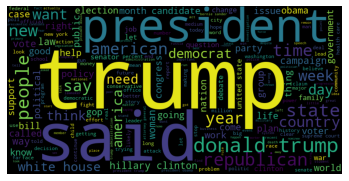

In [76]:
WC1(dataset[dataset['category']=='politics']['short_description_lemmatized_tokenized'].apply(lambda x: ' '.join(t for t in x)))

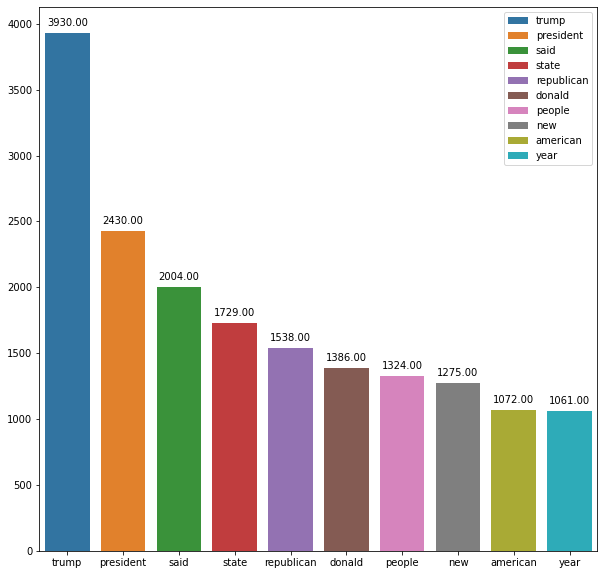

In [77]:
plot_graph(dict_short_description,'politics')

For Politics Category, even in short description column we have words like trump, president. This makes sense, because in short description it is expected to have such words.

Word Cloud of short_description_lemmatized_tokenized for 'wellness' Category

right approach ending food addiction craving away day right approach long list rule habit like healthiest eater feel little overwhelmed key listen day today uplifting inspiring positive person point wrong blaming judging criticizing default pattern focus people weakness stop consciously constructing positive habit life matter dance noticing whats working imagining brighter future taking tiny step everyday moment moment desired direction human fat cell photo dr peeke white fat normalweight person carry lifetime prerace jitter common marathon pro month training finally paid estella gong selfconscious body told scrawny proof accomplish case blood test showed patient mild iron deficiency examination intestine confirmed feel like thing going way want remember need moment supported guided given exactly need want people feel uncomfortable reality topic cancer taboo general public want change examined brain runner rat lazy rat found runner rat mature neuron cell procedure reduces risk infectio

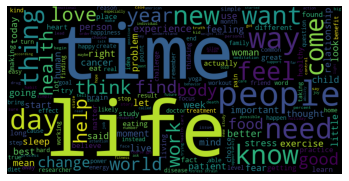

In [78]:
WC1(dataset[dataset['category']=='wellness']['short_description_lemmatized_tokenized'].apply(lambda x: ' '.join(t for t in x)))

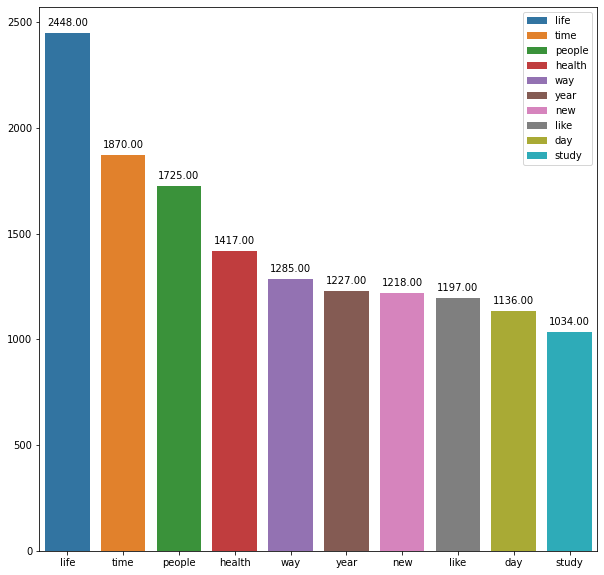

In [79]:
plot_graph(dict_short_description,'wellness')

For wellness column, we have word like life,time, people,etc. These are expected values for this column 

**Creating and Training models**

Now, in order to train our model correctly, we will make a new column called 'sum', where we will combine the text from the headline and the short summary into one text. We will then just feed our model with this column from the data to create predictions

In [80]:
dataset['sum'] = dataset['headline_lemmatized_tokenized'] + dataset['short_description_lemmatized_tokenized']

In [81]:
dataset.head()

,category,headline,short_description,headline_lemmatized_tokenized,short_description_lemmatized_tokenized,sum
0,entertainment,smith joins diplo nicky jam world cups officia...,course song,"[smith, join, diplo, nicky, jam, world, cup, o...","[course, song]","[smith, join, diplo, nicky, jam, world, cup, o..."
1,entertainment,hugh grant marries time age,actor longtime girlfriend anna eberstein tied ...,"[hugh, grant, marries, time, age]","[actor, longtime, girlfriend, anna, eberstein,...","[hugh, grant, marries, time, age, actor, longt..."
2,entertainment,jim carrey blasts castrato adam schiff democra...,actor gives dems asskicking fighting hard dona...,"[jim, carrey, blast, castrato, adam, schiff, d...","[actor, give, dems, asskicking, fighting, hard...","[jim, carrey, blast, castrato, adam, schiff, d..."
3,entertainment,julianna margulies uses donald trump poop bags...,dietland actress said bags cathartic therapeut...,"[julianna, margulies, us, donald, trump, poop,...","[dietland, actress, said, bag, cathartic, ther...","[julianna, margulies, us, donald, trump, poop,..."
4,entertainment,morgan freeman devastated sexual harassment cl...,right equate horrific incidents sexual assault...,"[morgan, freeman, devastated, sexual, harassme...","[right, equate, horrific, incident, sexual, as...","[morgan, freeman, devastated, sexual, harassme..."


We need to convert the sum column into a string, instead of a list of strings 

In [82]:
dataset['sum']=dataset['sum'].apply(lambda x: ' '.join(str(t) for t in x))
dataset.head()

,category,headline,short_description,headline_lemmatized_tokenized,short_description_lemmatized_tokenized,sum
0,entertainment,smith joins diplo nicky jam world cups officia...,course song,"[smith, join, diplo, nicky, jam, world, cup, o...","[course, song]",smith join diplo nicky jam world cup official ...
1,entertainment,hugh grant marries time age,actor longtime girlfriend anna eberstein tied ...,"[hugh, grant, marries, time, age]","[actor, longtime, girlfriend, anna, eberstein,...",hugh grant marries time age actor longtime gir...
2,entertainment,jim carrey blasts castrato adam schiff democra...,actor gives dems asskicking fighting hard dona...,"[jim, carrey, blast, castrato, adam, schiff, d...","[actor, give, dems, asskicking, fighting, hard...",jim carrey blast castrato adam schiff democrat...
3,entertainment,julianna margulies uses donald trump poop bags...,dietland actress said bags cathartic therapeut...,"[julianna, margulies, us, donald, trump, poop,...","[dietland, actress, said, bag, cathartic, ther...",julianna margulies us donald trump poop bag pi...
4,entertainment,morgan freeman devastated sexual harassment cl...,right equate horrific incidents sexual assault...,"[morgan, freeman, devastated, sexual, harassme...","[right, equate, horrific, incident, sexual, as...",morgan freeman devastated sexual harassment cl...


**Term Frequency–Inverse Document Frequency**

TFIDF (term frequency–inverse document frequency) is a numerical statistic that is intended to reflect how important a word is to a document in a collection
TFIDF value increases proportionally to the number of times a word appears in the document

In [83]:
tfidf = TfidfVectorizer(stop_words='english')
X  = tfidf.fit_transform(dataset['sum'])

We will use a function in Sklearn model selection for splitting data arrays into two subsets: for training data and for testing data. With this function, you don't need to divide the dataset manually.

By default, Sklearn train_test_split will make random partitions for the two subsets. However, you can also specify a random state for the operation.

In [84]:
y=dataset.category
X_train,X_test,y_train,y_test = train_test_split(X,dataset.category,test_size=0.3,random_state=17)

#Under Sampling
rus = RandomUnderSampler(random_state=42)
US_X_train, US_y_train = rus.fit_resample(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [85]:
names = dataset.category.unique()
score_df = pd.DataFrame(columns = ['Algorithm','Type','Accuracy_Score','F1_Score'])

We can view our results with the confusion_matrix and classification_report.

A Confusion matrix is an N x N matrix used for evaluating the performance of a classification model, where N is the number of target classes. The matrix compares the actual target values with those predicted by the machine learning model.
The classification report visualizer displays the precision, recall, F1, and support scores for the model.
For the confusion_matrix in our case, we will see that we have a 3x3 matrix, where 10 is the number of categories we have. The numbers on the diagonal represent how many news articles from each category were predicted correctly. We can see that we did a pretty good job, except for the wellness and healthy living categories, they seem to be less distinguished by our algorithm.

In [86]:
def plot_metric(y_test_plot,y_pred_plot):
  print(classification_report(y_test_plot, y_pred_plot))
  cm = confusion_matrix(y_test_plot, y_pred_plot) 
  # Transform to df for easier plotting
  cm_df = pd.DataFrame(cm,index = names, columns = names)
  plt.figure(figsize=(5,5))
  sns.heatmap(cm_df, annot=True, cmap = 'plasma', fmt='g')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

For Modelling purpose we will use a function where we will pass model with our choice of modelling dataset i.e. either normal(imbalanced dataset) or undersampled (Balanced dataset).

Our decision metric for this problem will be F1 score and accuracy score. F1 score because we want to focus precision and recall both. Accuray score to get estimate what % of category are classified correctly. 

In [87]:
# Define function to execute the model and get precision score
def modelling(model,flag):
  if flag == 1:
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    print('\nModel performance with imbalance data\n')
    print('Accuracy Score is',accuracy_score(y_test, y_pred))
    plot_metric(y_test,y_pred)
    return (accuracy_score(y_test, y_pred),f1_score(y_test, y_pred, average='macro' ))
  if flag == 2:
    model.fit(US_X_train,US_y_train)
    y_pred_u = model.predict(X_test)
    print('\nModel performance with after balncing data using undersampling')
    print('Accuracy Score is',accuracy_score(y_test, y_pred_u))
    plot_metric(y_test,y_pred_u)        
    return (accuracy_score(y_test, y_pred_u),f1_score(y_test, y_pred_u,average='macro'))

**LogisticRegression**

Logistic Regression

Model performance with imbalance data

Accuracy Score is 0.9356683345246605
               precision    recall  f1-score   support

entertainment       0.93      0.87      0.90      4149
     politics       0.94      0.96      0.95      8698
     wellness       0.93      0.95      0.94      5340

     accuracy                           0.94     18187
    macro avg       0.93      0.93      0.93     18187
 weighted avg       0.94      0.94      0.94     18187



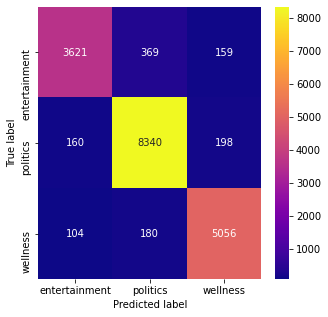


Model performance with after balncing data using undersampling
Accuracy Score is 0.9237367350305163
               precision    recall  f1-score   support

entertainment       0.87      0.91      0.89      4149
     politics       0.96      0.92      0.94      8698
     wellness       0.91      0.95      0.93      5340

     accuracy                           0.92     18187
    macro avg       0.91      0.92      0.92     18187
 weighted avg       0.93      0.92      0.92     18187



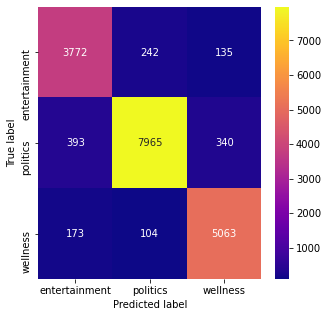

In [88]:
lr_clf = LogisticRegression(max_iter=1000)
print('Logistic Regression')

Accuracy_Score,F1_Score = modelling(lr_clf,1)
score_df = score_df.append({'Algorithm':'Logistic Regression','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)
Accuracy_Score,F1_Score = modelling(lr_clf,2)
score_df = score_df.append({'Algorithm':'Logistic Regression','Type':'Random Under Sampling','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

Logistic Regression tends to perform very good on normal dataset. We have accuracy of 0.9356 and we got a higher recall and precision, so this model seems to perform better

**Logistic Regression : libinear solver**<br>
We can try this again with a different classifier - Logistic regression

Logistic Regression (aka logit, MaxEnt) classifier.

Logistic Regression : libinear solver

Model performance with imbalance data

Accuracy Score is 0.9339638203112113
               precision    recall  f1-score   support

entertainment       0.94      0.86      0.90      4149
     politics       0.93      0.96      0.95      8698
     wellness       0.93      0.95      0.94      5340

     accuracy                           0.93     18187
    macro avg       0.93      0.92      0.93     18187
 weighted avg       0.93      0.93      0.93     18187



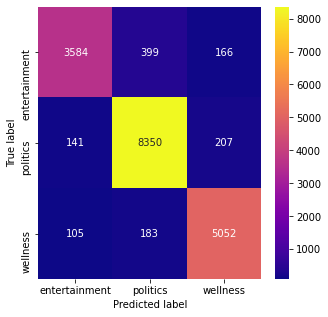


Model performance with after balncing data using undersampling
Accuracy Score is 0.9227470171001264
               precision    recall  f1-score   support

entertainment       0.87      0.91      0.89      4149
     politics       0.96      0.92      0.94      8698
     wellness       0.91      0.95      0.93      5340

     accuracy                           0.92     18187
    macro avg       0.91      0.92      0.92     18187
 weighted avg       0.92      0.92      0.92     18187



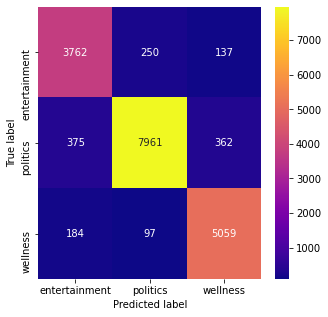

In [89]:
lib_lr_clf = LogisticRegression(max_iter=1000,solver='liblinear')
print('Logistic Regression : libinear solver')

Accuracy_Score,F1_Score = modelling(lib_lr_clf,1)
score_df = score_df.append({'Algorithm':'Logistic Regression : libinear solver','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)
Accuracy_Score,F1_Score = modelling(lib_lr_clf,2)
score_df = score_df.append({'Algorithm':'Logistic Regression : libinear solver','Type':'Random Under Sampling','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

There is not much difference between accruacy score of these solver but, 'lbfgs' solver performed better than 'liblinear'. 'lbfs' uses L2 penalty. It seems Ridge Classifier would perfrom better here.

**Random Forest**

Random Forest

Model performance with imbalance data

Accuracy Score is 0.9003134106779568
               precision    recall  f1-score   support

entertainment       0.90      0.79      0.84      4149
     politics       0.91      0.94      0.93      8698
     wellness       0.88      0.92      0.90      5340

     accuracy                           0.90     18187
    macro avg       0.90      0.88      0.89     18187
 weighted avg       0.90      0.90      0.90     18187



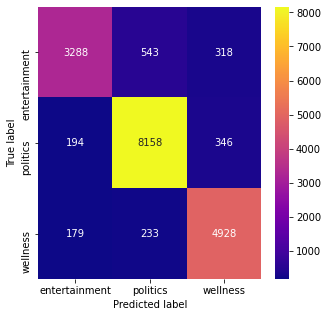


Model performance with after balncing data using undersampling
Accuracy Score is 0.8911860119865839
               precision    recall  f1-score   support

entertainment       0.84      0.84      0.84      4149
     politics       0.94      0.89      0.92      8698
     wellness       0.86      0.93      0.89      5340

     accuracy                           0.89     18187
    macro avg       0.88      0.89      0.88     18187
 weighted avg       0.89      0.89      0.89     18187



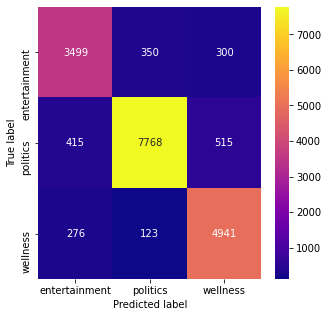

In [90]:
rand_clf = RandomForestClassifier()
print('Random Forest')
Accuracy_Score,F1_Score = modelling(rand_clf,1)
score_df = score_df.append({'Algorithm':'Random Forest','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)
Accuracy_Score,F1_Score = modelling(rand_clf,2)
score_df = score_df.append({'Algorithm':'Random Forest','Type':'Random Under Sampling','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

Accuracy Score for Random Forest is quite less than Logistic regrssion. It makes sense because we do not have categorical values in our dependent features. It looks like linear models are performing better than non-linear models.

**SVM**

SVM

Model performance with imbalance data

Accuracy Score is 0.9358332875130588
               precision    recall  f1-score   support

entertainment       0.94      0.86      0.90      4149
     politics       0.94      0.96      0.95      8698
     wellness       0.93      0.95      0.94      5340

     accuracy                           0.94     18187
    macro avg       0.94      0.93      0.93     18187
 weighted avg       0.94      0.94      0.94     18187



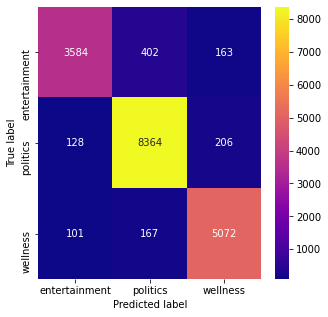


Model performance with after balncing data using undersampling
Accuracy Score is 0.9291801836476604
               precision    recall  f1-score   support

entertainment       0.88      0.91      0.90      4149
     politics       0.96      0.93      0.94      8698
     wellness       0.92      0.95      0.93      5340

     accuracy                           0.93     18187
    macro avg       0.92      0.93      0.92     18187
 weighted avg       0.93      0.93      0.93     18187



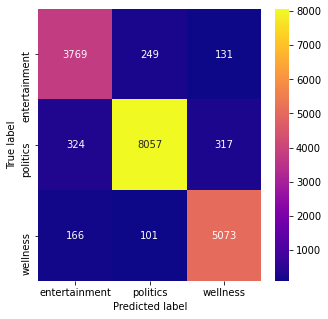

In [91]:
clf_svm = svm()
print('SVM')
Accuracy_Score,F1_Score = modelling(clf_svm,1)
score_df = score_df.append({'Algorithm':'SVM','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)
Accuracy_Score,F1_Score = modelling(clf_svm,2)
score_df = score_df.append({'Algorithm':'SVM','Type':'Random Under Sampling','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

As expected non-linear alorithm 'SVM' too did not perfromed as Linear Regression. Let us check for Ridge Classification.

**Ridge Classification**

Ridge Classification

Model performance with imbalance data

Accuracy Score is 0.9375927860559741
               precision    recall  f1-score   support

entertainment       0.94      0.87      0.91      4149
     politics       0.94      0.96      0.95      8698
     wellness       0.94      0.95      0.94      5340

     accuracy                           0.94     18187
    macro avg       0.94      0.93      0.93     18187
 weighted avg       0.94      0.94      0.94     18187



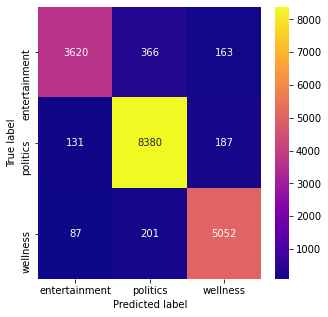


Model performance with after balncing data using undersampling
Accuracy Score is 0.9303898388959146
               precision    recall  f1-score   support

entertainment       0.89      0.91      0.90      4149
     politics       0.96      0.92      0.94      8698
     wellness       0.92      0.95      0.93      5340

     accuracy                           0.93     18187
    macro avg       0.92      0.93      0.93     18187
 weighted avg       0.93      0.93      0.93     18187



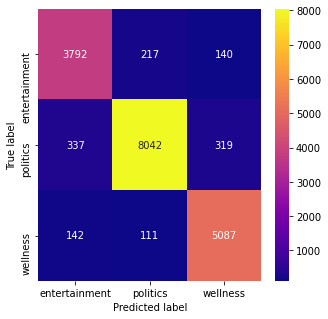

In [92]:
ridge=RidgeClassifier()
print('Ridge Classification')
Accuracy_Score,F1_Score = modelling(ridge,1)
score_df = score_df.append({'Algorithm':'Ridge Classification','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)
Accuracy_Score,F1_Score = modelling(ridge,2)
score_df = score_df.append({'Algorithm':'Ridge Classification','Type':'Random Under Sampling','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

Ridge Classification performed better than Logistic regression, with slight better accuracy score of 0.9375. Since our liner models are performing better, We can give  try to liner SVC

It is a Linear Support Vector Classification. Similar to SVC with parameter kernel=’linear’, but implemented in terms of liblinear rather than libsvm, so it has more flexibility in the choice of penalties and loss functions and should scale better to large numbers of samples. This class supports both dense and sparse input and the multiclass support is handled according to a one-vs-the-rest scheme.

Linear SVC

Linear SVC

Model performance with imbalance data

Accuracy Score is 0.9373178644086435
               precision    recall  f1-score   support

entertainment       0.93      0.88      0.91      4149
     politics       0.94      0.96      0.95      8698
     wellness       0.93      0.95      0.94      5340

     accuracy                           0.94     18187
    macro avg       0.94      0.93      0.93     18187
 weighted avg       0.94      0.94      0.94     18187



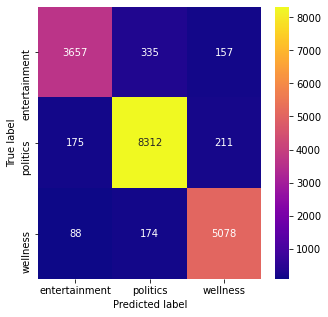


Model performance with after balncing data using undersampling
Accuracy Score is 0.9285753560235332
               precision    recall  f1-score   support

entertainment       0.88      0.91      0.89      4149
     politics       0.96      0.92      0.94      8698
     wellness       0.92      0.95      0.93      5340

     accuracy                           0.93     18187
    macro avg       0.92      0.93      0.92     18187
 weighted avg       0.93      0.93      0.93     18187



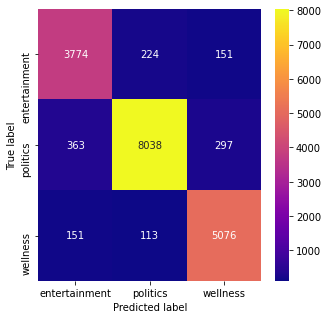

In [93]:
from sklearn.svm import LinearSVC
lsvc = LinearSVC()
print('Linear SVC')
Accuracy_Score,F1_Score = modelling(lsvc,1)
score_df = score_df.append({'Algorithm':'Linear SVC','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)
Accuracy_Score,F1_Score = modelling(lsvc,2)
score_df = score_df.append({'Algorithm':'Linear SVC','Type':'Random Under Sampling','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

Linear SVC performed better than logistic regression too. As expected for such models linear models are performing better. Before moving to hyper-parameter tunning. We can try XG-Boost.

**XGBoost**

XG Boost

Model performance with imbalance data

Accuracy Score is 0.7910045636993457
               precision    recall  f1-score   support

entertainment       0.94      0.50      0.65      4149
     politics       0.74      0.95      0.83      8698
     wellness       0.84      0.76      0.80      5340

     accuracy                           0.79     18187
    macro avg       0.84      0.74      0.76     18187
 weighted avg       0.81      0.79      0.78     18187



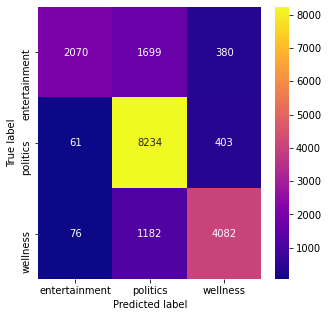


Model performance with after balncing data using undersampling
Accuracy Score is 0.7747292021773794
               precision    recall  f1-score   support

entertainment       0.56      0.84      0.67      4149
     politics       0.94      0.74      0.83      8698
     wellness       0.82      0.78      0.80      5340

     accuracy                           0.77     18187
    macro avg       0.77      0.79      0.77     18187
 weighted avg       0.82      0.77      0.78     18187



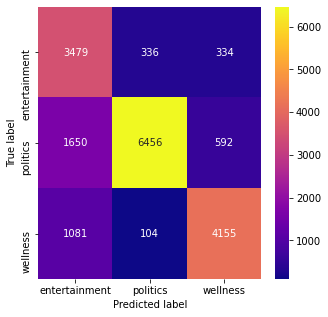

In [94]:
from xgboost import XGBClassifier
gbc = XGBClassifier()
print('XG Boost')
Accuracy_Score,F1_Score = modelling(gbc,1)
score_df = score_df.append({'Algorithm':'XG Boost','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)
Accuracy_Score,F1_Score = modelling(gbc,2)
score_df = score_df.append({'Algorithm':'XG Boost','Type':'Random Under Sampling','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

XG Boost has resulted into overfitting and accuracy score has been decreased to 0.79. 

**Summary**

In [95]:
score_df

,Algorithm,Type,Accuracy_Score,F1_Score
0,Logistic Regression,Normal,0.935668,0.930079
1,Logistic Regression,Random Under Sampling,0.923737,0.918774
2,Logistic Regression : libinear solver,Normal,0.933964,0.928068
3,Logistic Regression : libinear solver,Random Under Sampling,0.922747,0.917666
4,Random Forest,Normal,0.900313,0.889645
5,Random Forest,Random Under Sampling,0.891186,0.882318
6,SVM,Normal,0.935833,0.929991
7,SVM,Random Under Sampling,0.929180,0.924253
8,Ridge Classification,Normal,0.937593,0.932308
9,Ridge Classification,Random Under Sampling,0.930390,0.925885


**Hyper-Parameter Tunning**

We will try hyper-parameter tunning for 'Logistic Regression', 'Ridge Classification'and 'Linear SVC' Algorithm. We will train normal data.

**Logistic Regression**

In [96]:
grid = {
    'C': [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0],
    'penalty': ['l2'],
    'n_jobs': [-1]
}
hyp_lr_clf = LogisticRegression(max_iter=1000)
clf_cv=GridSearchCV(hyp_lr_clf,grid, cv=5)
clf_cv.fit(X_train, y_train)
print("Tuned Logistic Regression Parameters: {}".format(clf_cv.best_params_))
print("Best score is {}".format(clf_cv.best_score_))

Tuned Logistic Regression Parameters: {'C': 1.0, 'n_jobs': -1, 'penalty': 'l2'}
Best score is 0.9347927113492205


**Ridge Classification**

In [97]:
alphas = np.array([1,0.1,0.01,0.001,0.0001])
hyp_ridge = RidgeClassifier()
clf_ridge = GridSearchCV(hyp_ridge,param_grid=dict(alpha=alphas))
clf_ridge.fit(X_train, y_train)
print("Tuned Ridge Classification Parameters: {}".format(clf_ridge.best_params_))
print("Best score is {}".format(clf_ridge.best_score_))


Tuned Ridge Classification Parameters: {'alpha': 1.0}
Best score is 0.9352169644825079


**Linear SVC**

In [98]:
param_grid = {'C':np.arange(0.01,100,10)}
hyp_lsvc = LinearSVC()
clf_lsvc = GridSearchCV(hyp_lsvc,param_grid,cv=5,return_train_score=True)
clf_lsvc.fit(X_train, y_train)
print("Tuned Ridge Classification Parameters: {}".format(clf_lsvc.best_params_))
print("Best score is {}".format(clf_lsvc.best_score_))

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Tuned Ridge Classification Parameters: {'C': 10.01}
Best score is 0.9216665262903231


Execute models with Best Parameters

In [99]:
HP_score_df = pd.DataFrame(columns = ['Algorithm','Type','Accuracy_Score','F1_Score'])

Logistic Regression

Logistic Regression

Model performance with imbalance data

Accuracy Score is 0.9356683345246605
               precision    recall  f1-score   support

entertainment       0.93      0.87      0.90      4149
     politics       0.94      0.96      0.95      8698
     wellness       0.93      0.95      0.94      5340

     accuracy                           0.94     18187
    macro avg       0.93      0.93      0.93     18187
 weighted avg       0.94      0.94      0.94     18187



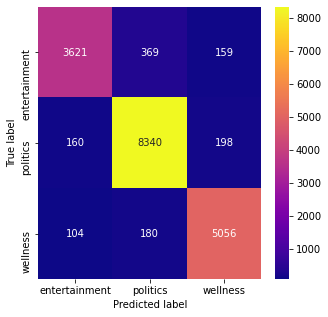

In [100]:
hp_lr_clf = LogisticRegression(C = 1.0, n_jobs= -1, penalty = 'l2',max_iter=1000)
print('Logistic Regression')

Accuracy_Score,F1_Score = modelling(hp_lr_clf,1)
HP_score_df = HP_score_df.append({'Algorithm':'Logistic Regression with best Hyper Parameters','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

Ridge Classification

Ridge Classification

Model performance with imbalance data

Accuracy Score is 0.9375927860559741
               precision    recall  f1-score   support

entertainment       0.94      0.87      0.91      4149
     politics       0.94      0.96      0.95      8698
     wellness       0.94      0.95      0.94      5340

     accuracy                           0.94     18187
    macro avg       0.94      0.93      0.93     18187
 weighted avg       0.94      0.94      0.94     18187



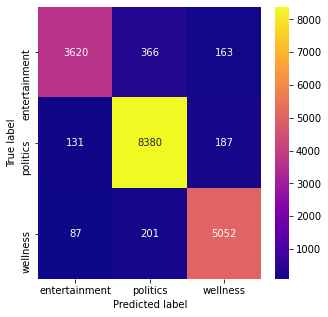

In [101]:
hp_ridge=RidgeClassifier(alpha = 1.0)
print('Ridge Classification')
Accuracy_Score,F1_Score = modelling(hp_ridge,1)
HP_score_df = HP_score_df.append({'Algorithm':'Ridge Classification with best Hyper Parameters','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

Linear SVC

Linear SVC

Model performance with imbalance data

Accuracy Score is 0.923571782042118
               precision    recall  f1-score   support

entertainment       0.90      0.87      0.89      4149
     politics       0.93      0.94      0.94      8698
     wellness       0.92      0.94      0.93      5340

     accuracy                           0.92     18187
    macro avg       0.92      0.92      0.92     18187
 weighted avg       0.92      0.92      0.92     18187



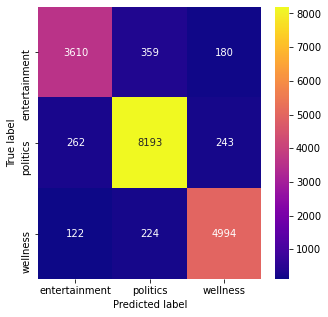

In [102]:
hp_lsvc = LinearSVC(C = 10.01)
print('Linear SVC')
Accuracy_Score,F1_Score = modelling(hp_lsvc,1)
HP_score_df = HP_score_df.append({'Algorithm':'Linear SVC with best Hyper Parameters','Type':'Normal','Accuracy_Score':Accuracy_Score,'F1_Score':F1_Score},ignore_index=True)

In [103]:
HP_score_df

,Algorithm,Type,Accuracy_Score,F1_Score
0,Logistic Regression with best Hyper Parameters,Normal,0.935668,0.930079
1,Ridge Classification with best Hyper Parameters,Normal,0.937593,0.932308
2,Linear SVC with best Hyper Parameters,Normal,0.923572,0.917633


Most import Words

In [104]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# override scikit's tfidf-vectorizer in order to return dataframe with feature names as columns
class DenseTfIdf(TfidfVectorizer):

    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        for k, v in kwargs.items():
            setattr(self, k, v)

    def transform(self, x, y=None) -> pd.DataFrame:
        res = super().transform(x)
        df = pd.DataFrame(res.toarray(), columns=self.get_feature_names())
        return df

    def fit_transform(self, x, y=None) -> pd.DataFrame:
        # run sklearn's fit_transform
        res = super().fit_transform(x, y=y)
        # convert the returned sparse documents-terms matrix into a dataframe to further manipulations
        df = pd.DataFrame(res.toarray(), columns=self.get_feature_names(), index=x.index)
        return df

In [105]:
# assume texts are stored in column 'text' within a dataframe
texts = dataset['sum']
df_docs_terms_corpus = DenseTfIdf(sublinear_tf=True,
                 max_df=0.5,
                 min_df=2,
                 encoding='ascii',
                 ngram_range=(1, 2),
                 lowercase=True,
                 max_features=1000,
                 stop_words='english'
                ).fit_transform(texts)




Entertainment

In [106]:
df_class = dataset[dataset["category"] == "entertainment"]
df_docs_terms_class = df_docs_terms_corpus.iloc[df_class.index]
pd.DataFrame(df_docs_terms_class.sum(axis=0).nlargest(n=10))

,0
new,400.663243
star,350.938708
movie,318.837569
film,298.110472
like,211.947529
year,201.104097
say,198.928639
music,196.727995
actor,192.200095
time,183.096100


Politics

In [107]:
df_class = dataset[dataset["category"] == "politics"]
df_docs_terms_class = df_docs_terms_corpus.iloc[df_class.index]
pd.DataFrame(df_docs_terms_class.sum(axis=0).nlargest(n=10))

,0
trump,2081.103905
donald,983.574726
donald trump,964.557331
president,731.010018
republican,674.522990
clinton,599.780226
gop,593.409572
state,576.868850
said,504.744223
say,495.438999


Wellness

In [108]:
df_class = dataset[dataset["category"] == "wellness"]
df_docs_terms_class = df_docs_terms_corpus.iloc[df_class.index]
pd.DataFrame(df_docs_terms_class.sum(axis=0).nlargest(n=10))

,0
life,611.403062
study,472.345474
health,439.603413
time,425.176041
people,415.267947
way,413.698775
day,349.270554
food,317.202458
sleep,313.930489
new,311.247333


**Conclusion**

<ul>
<li>Reidge Rigression performed best for this problem with acuuracy score of 0.93 and F1 score of 0.93</li>
<li>Most important words for Politics category are Donald,trump, president, republican</li>
<li>Most important words for Wellnes category are People, time, life, day, study </li>
<li>Most important words for Entertainment category are film, new, movie, star
</ul>
